In [ ]:
import pandas as pd
import numpy as np
import re
import string
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud
from langdetect import detect, LangDetectException

# Introduction
This notebook focuses on performing Topic Modeling on Reddit posts and comments related to Jewish topics.
The main algorithm used for topic extraction is LDA (Latent Dirichlet Allocation).
Workflow:
1. Preprocessing the text data - We clean the text data, including removing stopwords, special characters, and preparing the corpus for modeling.
2. Running the LDA model.
3. Analyzing and visualizing the results - we visualize the extracted topics using interactive topic modeling visualization.

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('omw-1.4')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to /home/luzone/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/luzone/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /home/luzone/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /home/luzone/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/luzone/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
! pip install --upgrade "jax[cuda12]" -f https://storage.googleapis.com/jax-releases/jax_releases.html

Looking in links: https://storage.googleapis.com/jax-releases/jax_releases.html
  Using cached jax-0.5.1-py3-none-any.whl.metadata (22 kB)
  Using cached jaxlib-0.5.1-cp311-cp311-manylinux2014_x86_64.whl.metadata (978 bytes)
  Using cached jax_cuda12_plugin-0.5.1-cp311-cp311-manylinux2014_x86_64.whl.metadata (1.2 kB)
  Using cached jax_cuda12_pjrt-0.5.1-py3-none-manylinux2014_x86_64.whl.metadata (348 bytes)
Using cached jaxlib-0.5.1-cp311-cp311-manylinux2014_x86_64.whl (105.1 MB)
Using cached jax_cuda12_plugin-0.5.1-cp311-cp311-manylinux2014_x86_64.whl (16.7 MB)
Using cached jax_cuda12_pjrt-0.5.1-py3-none-manylinux2014_x86_64.whl (104.3 MB)
Using cached jax-0.5.1-py3-none-any.whl (2.4 MB)


In [ ]:
import re
import string

import gensim
import gensim.corpora as corpora
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

from collections import Counter
import pickle

In [ ]:
# Load data
print("=== Loading Posts ===")
df_posts = pd.read_csv("/dt/yisroel/Users/luzone/BIG_DATA/df_text_submissions.csv")
# columns: id, title, selftext, had_removed_placeholder, combined_text, detected_lang

df_posts

=== Loading Posts ===


,id,title,selftext,had_removed_placeholder,combined_text,detected_lang
0,16wmqwf,Malaysian friend wanting to come with me to Is...,NaN,True,Malaysian friend wanting to come with me to Is...,en
1,16wneyf,Houthi Music Video Threatening Israel: The Zio...,Aired earlier this month on the Houthis' offic...,False,Houthi Music Video Threatening Israel: The Zio...,en
2,16wpf89,A peace deal between the Saudis and Israelis c...,NaN,False,A peace deal between the Saudis and Israelis c...,en
3,16wqaq6,is it true the 40% of israelis think of immigr...,Is it true ?! If so why ?!,False,is it true the 40% of israelis think of immigr...,en
4,16wqqcd,Queer in Jerusalem,I am out and proud Queer man (very straight pa...,False,Queer in Jerusalem I am out and proud Queer ma...,en
...,...,...,...,...,...,...
72230,1gy9slo,Looking for Book Recommendations on Reformed J...,Hi everyone!\n\nI’m planning to convert to Ref...,False,Looking for Book Recommendations on Reformed J...,en
72231,1gzg1nt,"Hello, is it possible to be jewish and hindu a...",I am currently converting to reform judaism an...,False,"Hello, is it possible to be jewish and hindu a...",en
72232,1h1osgd,Infinite Light,"Hi, all, I grew up orthodox, then spent many y...",False,"Infinite Light Hi, all, I grew up orthodox, th...",en
72233,1h2q1hg,Do you cover your eyes during th Shema?,NaN,True,Do you cover your eyes during th Shema?,en


In [ ]:
print("\n=== Loading Comments ===")
df_comments = pd.read_csv('/dt/yisroel/Users/luzone/BIG_DATA/df_text_comments.csv')
# columns: id, body, detected_lang

df_comments


=== Loading Comments ===


,id,body,detected_lang
0,k2xmbj4,They’re not related. Yiddish has some Hebrew w...,en
1,k2xmqha,Israelis,et
2,k2xn704,"Probably a terrible suggestion, but some over ...",en
3,k2xngji,"There was a great big moose, who liked to drin...",en
4,k2xns1o,I know they live in Israel and serve. Never he...,en
...,...,...,...
1380099,lzrb67v,"thank you for this post, I found it helpful.",en
1380100,lzrjaje,You are not for us. Sorry. I don't mean that i...,en
1380101,lzrjx4g,"No, I'm referring to Christians.",en
1380102,lzrk0cc,The services I attend at my Reform synagogue a...,en


In [ ]:
def keep_english(df, col='detected_lang'):
    """
    Filter to rows that are either 'en' or 'he'.
    """
    allowed_langs = ['en']
    return df[df[col].isin(allowed_langs)].copy()

In [ ]:
df_posts = keep_english(df_posts, 'detected_lang')
df_comments = keep_english(df_comments, 'detected_lang')

print(f"\nPosts after filtering to en/he: {df_posts.shape}")
print(f"Comments after filtering to en/he: {df_comments.shape}")


Posts after filtering to en/he: (67282, 6)
Comments after filtering to en/he: (1307830, 3)


In [ ]:
stop_words = set(stopwords.words('english'))

def basic_clean_for_wordcloud(text):
    """
    Lowercase, remove punctuation, remove short tokens, remove stopwords.
    """
    if not isinstance(text, str):
        return ""
    text = text.lower()
    text = re.sub(r'http\S+|www\S+','', text)
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = word_tokenize(text)
    tokens = [t for t in tokens if t.lower() not in stop_words and len(t)>2]
    return " ".join(tokens)

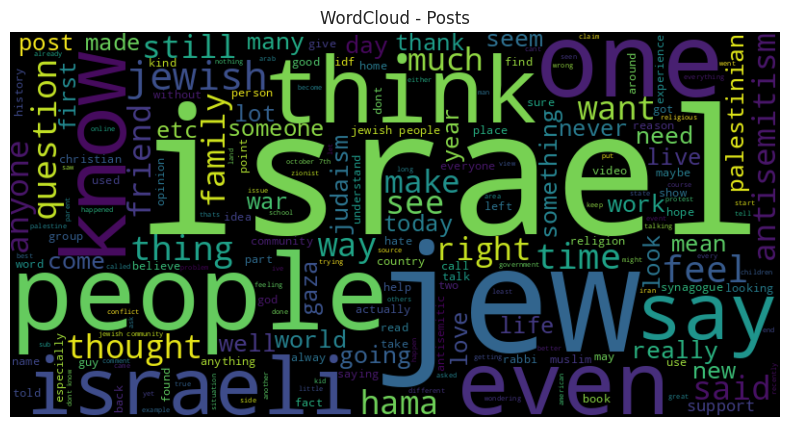

In [ ]:
# Combine posts text for wordcloud
all_posts_text = df_posts['combined_text'].fillna('').apply(basic_clean_for_wordcloud).tolist()
all_posts_text = " ".join(all_posts_text)

wc_posts = WordCloud(width=800, height=400, background_color="black").generate(all_posts_text)
plt.figure(figsize=(10,5))
plt.imshow(wc_posts, interpolation='bilinear')
plt.axis("off")
plt.title("WordCloud - Posts")
plt.show()

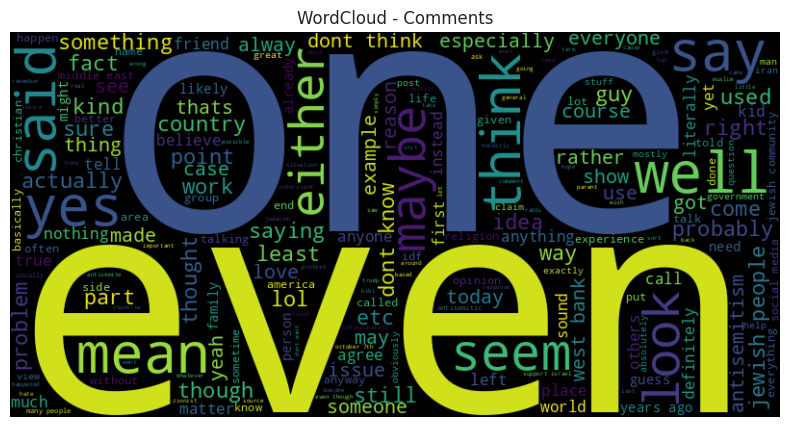

In [ ]:
# Combine comments text for wordcloud
if 'body' in df_comments.columns:
    all_comments_text = df_comments['body'].fillna('').apply(basic_clean_for_wordcloud).tolist()
    all_comments_text = " ".join(all_comments_text)

    wc_comments = WordCloud(width=800, height=400, background_color="black").generate(all_comments_text)
    plt.figure(figsize=(10,5))
    plt.imshow(wc_comments, interpolation='bilinear')
    plt.axis("off")
    plt.title("WordCloud - Comments")
    plt.show()

# **LDA MODELING**

In [ ]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

custom_synonyms = {
    "jews": "jewish", "jew": "jewish", "judaism": "jewish",
    "ww2": "holocaust",
    "zionist": "zionism", "zionists": "zionism",
    "israelis": "israeli",
    "palestinians": "palestinian",
    "warfare": "war",
    "military": "army", "armies": "army",
    "synagogues": "synagogue",
    "rabbinical": "rabbi", "rabbis": "rabbi",
    "conversion": "convert",
    "terrorists": "terrorism",
    "conflicts": "conflict",
    "weapons": "weapon"
}

def clean_text(text):
    if not isinstance(text, str):
        return ""
    text = text.lower()
    # remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)
    # remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # tokenize
    tokens = word_tokenize(text)
    # remove stopwords / short tokens / lemetization / synonyms
    tokens = [t for t in tokens if t.lower() not in stop_words and len(t) > 2]
    tokens = [lemmatizer.lemmatize(t, pos="v") for t in tokens]
    tokens = [lemmatizer.lemmatize(t, pos="n") for t in tokens]
    tokens = [custom_synonyms.get(t, t) for t in tokens]
    return " ".join(tokens)

df_posts['cleaned_text'] = df_posts['combined_text'].apply(clean_text)
df_posts = df_posts[df_posts['cleaned_text'].str.split().str.len() > 5]

df_comments['cleaned_text'] = df_comments['body'].fillna('').apply(clean_text)
df_comments = df_comments[df_comments['cleaned_text'].str.split().str.len() > 5]

In [ ]:
df_posts

,id,title,selftext,had_removed_placeholder,combined_text,detected_lang,cleaned_text
1,16wneyf,Houthi Music Video Threatening Israel: The Zio...,Aired earlier this month on the Houthis' offic...,False,Houthi Music Video Threatening Israel: The Zio...,en,houthi music video threaten israel zionism dis...
2,16wpf89,A peace deal between the Saudis and Israelis c...,NaN,False,A peace deal between the Saudis and Israelis c...,en,peace deal saudi israeli could change everythi...
3,16wqaq6,is it true the 40% of israelis think of immigr...,Is it true ?! If so why ?!,False,is it true the 40% of israelis think of immigr...,en,true israeli think immigration israel true
4,16wqqcd,Queer in Jerusalem,I am out and proud Queer man (very straight pa...,False,Queer in Jerusalem I am out and proud Queer ma...,en,queer jerusalem proud queer man straight pas t...
7,16wred6,"Is there still racism between askenzai, sephar...",NaN,True,"Is there still racism between askenzai, sephar...",en,still racism askenzai sephardic mizardi ethiop...
...,...,...,...,...,...,...,...
72229,1gy0m2o,Thank You,I wanted to thank you guys for the advice you'...,False,Thank You I wanted to thank you guys for the a...,en,thank want thank guy advice youve give story y...
72230,1gy9slo,Looking for Book Recommendations on Reformed J...,Hi everyone!\n\nI’m planning to convert to Ref...,False,Looking for Book Recommendations on Reformed J...,en,look book recommendation reform jewish everyon...
72231,1gzg1nt,"Hello, is it possible to be jewish and hindu a...",I am currently converting to reform judaism an...,False,"Hello, is it possible to be jewish and hindu a...",en,hello possible jewish hindu time currently con...
72232,1h1osgd,Infinite Light,"Hi, all, I grew up orthodox, then spent many y...",False,"Infinite Light Hi, all, I grew up orthodox, th...",en,infinite light grow orthodox spend many year l...


In [ ]:
df_comments

,id,body,detected_lang,cleaned_text
2,k2xn704,"Probably a terrible suggestion, but some over ...",en,probably terrible suggestion enthusiastic morm...
3,k2xngji,"There was a great big moose, who liked to drin...",en,great big moose like drink lot juice
4,k2xns1o,I know they live in Israel and serve. Never he...,en,know live israel serve never hear anyone probl...
5,k2xofq0,If OPs mother doesn't know Hebrew (like I imag...,en,ops mother doesnt know hebrew like imagine tou...
6,k2xosu4,The yiddish speaking ppl in israel also know h...,en,yiddish speak ppl israel also know hebrew lang...
...,...,...,...,...
1380097,lzqukc3,"My sibling in Moshe, what drugs have you been ...",en,sibling moshe drug take ask two rabbi response...
1380098,lzrakvb,"""steal our stuff"" is quite mean if you meant t...",en,steal stuff quite mean mean equate convert
1380100,lzrjaje,You are not for us. Sorry. I don't mean that i...,en,sorry dont mean cruel way nope
1380102,lzrk0cc,The services I attend at my Reform synagogue a...,en,service attend reform synagogue discus praise ...


## Build LDA on Posts

In [ ]:
# Convert text to tokenized format after stemming
docs = [doc.split() for doc in df_posts['cleaned_text']]
comment_tokens = [c.split() for c in df_comments['cleaned_text']]

all_tokens = docs + comment_tokens

In [ ]:
import collections
from collections import Counter
# Print the most common words after stemming
word_counts = Counter([word for doc in all_tokens for word in doc])
most_common_words = word_counts.most_common(20)
print("\nTop 20 most frequent words after stemming:")
for word, freq in most_common_words:
    print(f"{word}: {freq}")


Top 20 most frequent words after stemming:
jewish: 580099
israel: 310043
people: 304588
like: 231684
say: 210058
think: 204598
would: 186711
one: 181513
get: 178254
know: 167664
make: 160788
dont: 135925
want: 132760
even: 131089
also: 130558
see: 123479
time: 113938
thing: 108940
hamas: 106698
go: 104372


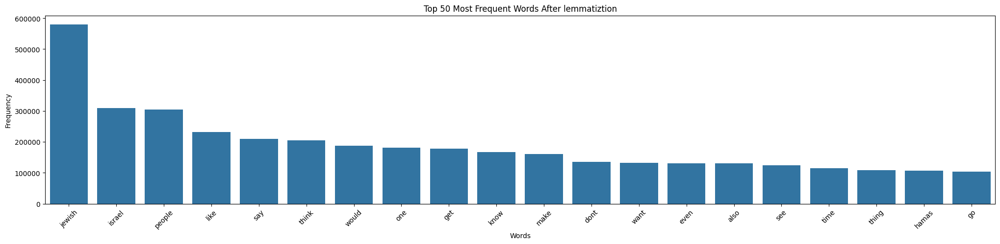

In [ ]:
# Plot the most common words
words, freqs = zip(*most_common_words)
plt.figure(figsize=(25, 5))
sns.barplot(x=list(words), y=list(freqs))
plt.xticks(rotation=45)
plt.title("Top 50 Most Frequent Words After lemmatiztion")
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.show()

In [ ]:
# Create dictionary and BoW corpus for posts
dictionary = corpora.Dictionary(all_tokens)
dictionary.filter_extremes(no_below=5, no_above=0.4)
corpus = [dictionary.doc2bow(t) for t in docs]

# Print dictionary details
print("\nNumber of documents:", len(corpus))
print("Dictionary size:", len(dictionary))


Number of documents: 50708
Dictionary size: 54169


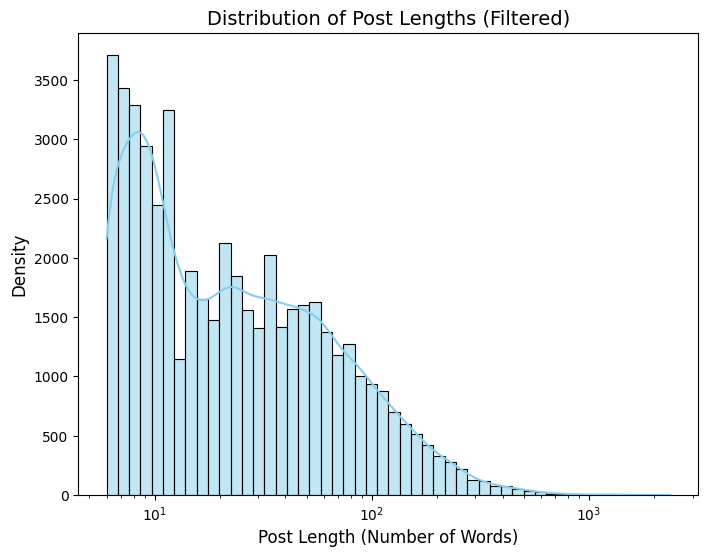

In [ ]:
df_posts['text_length'] = df_posts['cleaned_text'].apply(lambda x: len(x.split()))

plt.figure(figsize=(8, 6))
sns.histplot(df_posts['text_length'], kde=True, bins=50, color="skyblue", log_scale=True)
plt.xlabel("Post Length (Number of Words)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("Distribution of Post Lengths (Filtered)", fontsize=14)
plt.show()

In [ ]:
# Compute statistics
min_length = df_posts['text_length'].min()
max_length = df_posts['text_length'].max()
mean_length = df_posts['text_length'].mean()
median_length = df_posts['text_length'].median()
percentile_99 = np.percentile(df_posts['text_length'], 99)

# Print results
print(f"Minimum Post Length: {min_length} words")
print(f"Maximum Post Length: {max_length} words")
print(f"Average Post Length: {mean_length:.2f} words")
print(f"Median Post Length: {median_length} words")
print(f"99th Percentile Post Length: {percentile_99} words")

Minimum Post Length: 6 words
Maximum Post Length: 2366 words
Average Post Length: 41.48 words
Median Post Length: 20.0 words
99th Percentile Post Length: 288.0 words


In [ ]:
def compute_coherence_values(dictionary, corpus, texts, start=1, limit=20, step=1):
    """
    Train LDA models for each k in [start, limit], step=1,
    compute c_v coherence for each, return (k_list, coherence_list, model_list).
    """
    coherence_values = []
    model_list = []
    k_values = []

    for k in range(start, limit+1, step):
        print(f"Training LDA for k={k} ...", end="")

        lda_model = LdaMulticore(
            corpus=corpus,
            id2word=dictionary,
            num_topics=k,
            workers=6,
            random_state=42,
            passes=20,
            chunksize=1000,
            iterations=150,
        )

        model_list.append(lda_model)
        k_values.append(k)

        # Compute Coherence
        coherence_model_lda = CoherenceModel(
            model=lda_model,
            texts=texts,
            dictionary=dictionary,
            coherence='c_v'
        )
        coherence_lda = coherence_model_lda.get_coherence()
        coherence_values.append(coherence_lda)

        print(f"  Coherence={coherence_lda:.4f}")

    return k_values, coherence_values, model_list

In [ ]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

start_k = 1
end_k   = 20
step_k  = 1

k_values, coherence_vals, models = compute_coherence_values(
    dictionary=dictionary,
    corpus=corpus,
    texts=docs,
    start=start_k,
    limit=end_k,
    step=step_k
)

Training LDA for k=1 ...  Coherence=0.4331
Training LDA for k=2 ...  Coherence=0.4774
Training LDA for k=3 ...  Coherence=0.5123
Training LDA for k=4 ...  Coherence=0.4800
Training LDA for k=5 ...  Coherence=0.4592
Training LDA for k=6 ...  Coherence=0.4992
Training LDA for k=7 ...  Coherence=0.5081
Training LDA for k=8 ...  Coherence=0.5120
Training LDA for k=9 ...  Coherence=0.4915
Training LDA for k=10 ...  Coherence=0.4868
Training LDA for k=11 ...  Coherence=0.4938
Training LDA for k=12 ...  Coherence=0.4808
Training LDA for k=13 ...  Coherence=0.4771
Training LDA for k=14 ...  Coherence=0.4560
Training LDA for k=15 ...  Coherence=0.4760
Training LDA for k=16 ...  Coherence=0.5049
Training LDA for k=17 ...  Coherence=0.4742
Training LDA for k=18 ...  Coherence=0.4806
Training LDA for k=19 ...  Coherence=0.4373
Training LDA for k=20 ...  Coherence=0.4461


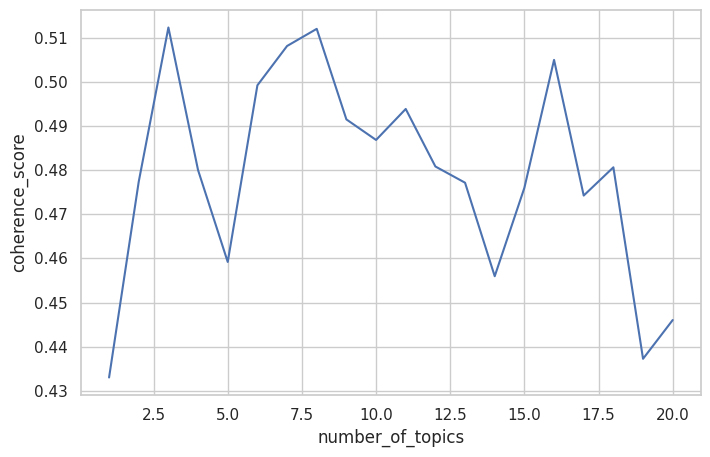

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(8, 5))
plt.plot(k_values, coherence_vals, linestyle='-', linewidth=1.5)
plt.xlabel("number_of_topics")
plt.ylabel("coherence_score")

plt.show()

# Saving the figure to a file
plt.savefig("/dt/yisroel/Users/luzone/BIG_DATA/IMAGES/LDA/coherence_vs_topics.png", dpi=300)
plt.close()

In [ ]:
def print_topics(model, num_words=10):
    for idx, topic in model.show_topics(num_topics=-1, num_words=num_words, formatted=False):
        print(f"Topic {idx+1}: ", [word for word, _ in topic])

print(" Topics for K=3")
print_topics(models[k_values.index(3)])

print(" Topics for K=7")
print_topics(models[k_values.index(7)])

print(" Topics for K=8")
print_topics(models[k_values.index(8)])

 Topics for K=3
Topic 1:  ['israel', 'israeli', 'hamas', 'gaza', 'war', 'palestinian', 'attack', 'state', 'hostage', 'idf']
Topic 2:  ['jewish', 'know', 'like', 'would', 'want', 'get', 'make', 'one', 'year', 'convert']
Topic 3:  ['jewish', 'people', 'israel', 'like', 'say', 'think', 'feel', 'know', 'see', 'make']
 Topics for K=7
Topic 1:  ['israel', 'war', 'gaza', 'israeli', 'hamas', 'iran', 'idf', 'say', 'army', 'hezbollah']
Topic 2:  ['jewish', 'would', 'know', 'get', 'want', 'like', 'anyone', 'look', 'year', 'make']
Topic 3:  ['jewish', 'antisemitism', 'student', 'post', 'antisemitic', 'university', 'campus', 'protest', 'new', 'holocaust']
Topic 4:  ['hamas', 'gaza', 'kill', 'israeli', 'hostage', 'palestinian', 'terrorist', 'october', 'attack', 'israel']
Topic 5:  ['israel', 'jewish', 'palestinian', 'state', 'country', 'israeli', 'arab', 'land', 'people', 'would']
Topic 6:  ['jewish', 'say', 'know', 'family', 'name', 'convert', 'torah', 'question', 'religion', 'rabbi']
Topic 7:  ['j

In [ ]:
lda_model = LdaMulticore(
            corpus=corpus,
            id2word=dictionary,
            num_topics= 8,
            workers=6,
            random_state=42,
            passes=20,
            chunksize=1000,
            iterations=150,
        )

In [ ]:
print("Number of topics in LDA model:", len(lda_model.get_topics()))

Number of topics in LDA model: 8


In [ ]:
topics = lda_model.print_topics(num_topics=8, num_words=10)

topics_sorted = sorted(topics, key=lambda x: x[0])

for idx, topic in topics_sorted:
    print(f"Topic #{idx}: {topic}\n")

Topic #0: 0.049*"israel" + 0.017*"war" + 0.013*"iran" + 0.012*"gaza" + 0.011*"hamas" + 0.011*"israeli" + 0.009*"say" + 0.009*"hezbollah" + 0.009*"army" + 0.009*"idf"

Topic #1: 0.013*"get" + 0.011*"would" + 0.011*"know" + 0.011*"want" + 0.010*"like" + 0.008*"anyone" + 0.008*"look" + 0.008*"work" + 0.008*"go" + 0.008*"year"

Topic #2: 0.030*"jewish" + 0.018*"antisemitism" + 0.015*"student" + 0.012*"post" + 0.012*"antisemitic" + 0.010*"university" + 0.009*"protest" + 0.008*"campus" + 0.007*"zionism" + 0.007*"holocaust"

Topic #3: 0.033*"hamas" + 0.019*"gaza" + 0.014*"kill" + 0.014*"hostage" + 0.013*"israeli" + 0.012*"terrorist" + 0.012*"october" + 0.011*"attack" + 0.011*"palestinian" + 0.010*"israel"

Topic #4: 0.038*"israel" + 0.013*"palestinian" + 0.012*"state" + 0.011*"israeli" + 0.011*"country" + 0.010*"jewish" + 0.010*"arab" + 0.008*"land" + 0.007*"people" + 0.007*"world"

Topic #5: 0.008*"torah" + 0.008*"one" + 0.008*"day" + 0.007*"say" + 0.007*"song" + 0.007*"make" + 0.007*"god" +

In [ ]:
best_k = 8
best_idx = best_k - 1

print(f"\nBest K = {best_k} with Coherence = {coherence_vals[best_idx]:.4f}")

# Save the model
model_path = f'/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/LDA_model_k{best_k}.pkl'

with open(model_path, 'wb') as f:
    pickle.dump(lda_model, f)

print(f"Model with K={best_k} saved to {model_path}")


Best K = 8 with Coherence = 0.5120
Model with K=8 saved to /dt/yisroel/Users/luzone/BIG_DATA/models/LDA/LDA_model_k8.pkl


In [ ]:
best_k = 8

model_path = f'/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/LDA_model_k{best_k}.pkl'

with open(model_path, 'rb') as f:
    lda_model = pickle.load(f)

print(f"Model with K={best_k} loaded successfully from {model_path}")

Model with K=8 loaded successfully from /dt/yisroel/Users/luzone/BIG_DATA/models/LDA/LDA_model_k8.pkl


In [ ]:
print("Number of topics in LDA model:", len(lda_model.get_topics()))

Number of topics in LDA model: 8


In [ ]:
def get_topic_word_weights(lda_model, dictionary, topic_id, topn=10):
    """
    Returns a list of (word, weight) for the given topic_id.
    """
    # get_topic_terms returns (word_id, prob) for topn words
    terms = lda_model.get_topic_terms(topic_id, topn=topn)
    word_weights = []
    for word_id, weight in terms:
        word = dictionary[word_id]
        word_weights.append((word, weight))
    return word_weights

def topic_words_dataframe(lda_model, dictionary, num_topics=13, topn=10):
    """
    Builds a DataFrame that shows the top words + weights for each topic
    in a table-like format.
    """
    # Each column pair = (Topic i, Weight i)
    # We'll store a list of dicts, or build a wide table
    data = {}
    # For each topic, fetch topn words
    for t_id in range(num_topics):
        tw = get_topic_word_weights(lda_model, dictionary, t_id, topn=topn)
        # we want lists of words, lists of weights
        words  = [w[0] for w in tw]
        weights= [w[1] for w in tw]
        data[f"Topic {t_id}"] = words
        data[f"Weights {t_id}"] = weights

    # The resulting DataFrame will have topn rows, and 2*num_topics columns
    df_topics = pd.DataFrame(data)
    return df_topics

# Example usage:
num_topics = 8
df_topic_words = topic_words_dataframe(lda_model, dictionary, num_topics=8, topn=15)
df_topic_words


,Topic 0,Weights 0,Topic 1,Weights 1,Topic 2,Weights 2,Topic 3,Weights 3,Topic 4,Weights 4,Topic 5,Weights 5,Topic 6,Weights 6,Topic 7,Weights 7
0,israel,0.048365,get,0.012776,jewish,0.031020,hamas,0.033353,israel,0.035413,torah,0.010311,jewish,0.021632,jewish,0.087120
1,war,0.016757,know,0.010906,antisemitism,0.019679,gaza,0.018545,jewish,0.012505,one,0.007884,people,0.020991,convert,0.014172
2,iran,0.012259,would,0.010740,student,0.016938,kill,0.013495,state,0.011834,book,0.007510,like,0.014985,reform,0.009689
3,israeli,0.011148,want,0.010572,antisemitic,0.012507,israeli,0.013016,palestinian,0.011267,song,0.007069,feel,0.013893,would,0.009220
4,gaza,0.010794,like,0.009304,university,0.011162,hostage,0.012940,country,0.010899,day,0.007009,say,0.012771,community,0.008871
5,say,0.009658,work,0.008451,post,0.011079,october,0.011345,israeli,0.010362,say,0.006918,think,0.011621,family,0.008673
6,hamas,0.009548,look,0.008344,protest,0.010035,attack,0.011200,arab,0.008938,god,0.006668,know,0.011221,know,0.008215
7,hezbollah,0.008936,make,0.008148,campus,0.008820,israel,0.011117,land,0.007554,music,0.006419,get,0.009777,rabbi,0.007215
8,army,0.008498,go,0.007922,zionism,0.008141,terrorist,0.011094,people,0.006890,read,0.006270,see,0.009304,like,0.007086
9,idf,0.007824,anyone,0.007887,holocaust,0.006403,palestinian,0.010864,world,0.006688,prayer,0.006101,make,0.008643,question,0.006492


This method highlights the most frequent words in each topic.
However, since it does not consider word uniqueness, some words may appear in multiple topics, making it harder to distinguish between them.

## Relevancy
In topic modeling, some words rank high for a topic simply because they are common across the entire corpus. To highlight words that are more unique to each topic, we use a relevance score.

The relevance of a word to a topic is calculated as:
 ##### r(w, k | λ) = λ * log(ϕ_kw) + (1 - λ) * log(ϕ_kw / p_w)
 ##### where:
 ##### ϕ_kw = probability of word w in topic k
 ##### p_w = overall probability of word w in the corpus
  Lower λ gives more weight to words that are exclusive to the topic.

The tool pyLDAvis allows adjusting λ to control how much focus is given to exclusivity. For example, lowering λ can reveal words that are even more strongly tied to a specific topic, like “haircut” in a hair salon topic.

Reference: https://nlp.stanford.edu/events/illvi2014/papers/sievert-illvi2014.pdf

In [ ]:
import pyLDAvis.gensim_models

def get_topic_relevant_words(topic_data, topic_id, topn=10, lambd=0.2):
    """
    Returns a list of (word, relevance) for the given topic_id,
    sorted by relevance using the loglift and logprob metrics.
    """
    topic_label = f"Topic{topic_id + 1}"  # pyLDAvis uses 1-based indexing for topics
    topic_df = topic_data.topic_info[topic_data.topic_info.Category == topic_label].copy()

    # Compute relevance score
    topic_df["relevance"] = topic_df["loglift"] * (1 - lambd) + topic_df["logprob"] * lambd

    # Select top N relevant words
    topic_df_sorted = topic_df.sort_values(by="relevance", ascending=False).head(topn)

    return list(zip(topic_df_sorted["Term"], topic_df_sorted["relevance"]))

def topic_relevance_dataframe(topic_data, num_topics=8, topn=10, lambd=0.2):
    """
    Builds a DataFrame that shows the top words + relevance for each topic
    in a table-like format, sorted by relevance.
    """
    data = {}

    for t_id in range(num_topics):
        relevant_words = get_topic_relevant_words(topic_data, t_id, topn=topn, lambd=lambd)

        words  = [w[0] for w in relevant_words]
        relevance_scores = [w[1] for w in relevant_words]

        data[f"Topic {t_id}"] = words
        data[f"Relevance {t_id}"] = relevance_scores

    df_topics = pd.DataFrame(data)
    return df_topics


topic_data = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='pcoa', n_jobs=1)


df_topic_relevance = topic_relevance_dataframe(topic_data, num_topics=8, topn=15, lambd=0.15)
df_topic_relevance

,Topic 0,Relevance 0,Topic 1,Relevance 1,Topic 2,Relevance 2,Topic 3,Relevance 3,Topic 4,Relevance 4,Topic 5,Relevance 5,Topic 6,Relevance 6,Topic 7,Relevance 7
0,people,0.216470,convert,0.884640,wear,0.737555,arab,1.078820,hamas,1.546570,song,1.543005,iran,1.771965,student,1.718375
1,feel,0.144195,reform,0.827680,kosher,0.699130,land,1.047570,terrorist,1.508115,music,1.488765,hezbollah,1.740940,ban,1.707715
2,hanukkah,0.024940,jewish,0.714700,shul,0.667635,settler,0.926385,hostage,1.467195,christmas,1.476635,netanyahu,1.713165,campus,1.688500
3,see,0.023285,orthodox,0.712565,shabbat,0.633320,nation,0.924905,civilian,1.432930,passover,1.470695,biden,1.649645,university,1.617220
4,bad,0.015275,religion,0.659190,buy,0.631485,state,0.896270,kill,1.416630,megathread,1.460205,minister,1.643620,professor,1.613330
5,friend,0.007760,ashkenazi,0.632965,email,0.558120,west,0.836535,soldier,1.362610,yom,1.433380,iranian,1.636290,columbia,1.601640
6,dont,-0.003170,religious,0.629910,travel,0.556290,menorah,0.832690,massacre,1.362420,kippur,1.427790,lebanon,1.604980,protest,1.561140
7,happen,-0.014935,raise,0.623935,trip,0.545350,country,0.823405,hospital,1.352535,sing,1.411255,court,1.593455,encampment,1.558550
8,hate,-0.018240,mother,0.620330,kippah,0.532125,indigenous,0.808155,murder,1.335770,seder,1.403610,bibi,1.583585,san,1.538030
9,talk,-0.018665,catholic,0.606520,necklace,0.531735,east,0.805065,kidnap,1.333775,rosh,1.390210,prime,1.537755,flag,1.522630


In [ ]:
def format_topic_data(df_weights, df_relevance, num_topics=8):
    """
    Formats the topic words from both weight-based and relevance-based dataframes
    into a list of tuples (word, score) for each topic with scores rounded to 3 decimal places.
    """
    formatted_topics = {}

    for t_id in range(num_topics):
        # Extract words and scores for each topic, rounding scores to 3 decimal places
        weight_words = [(word, round(score, 3)) for word, score in zip(df_weights[f"Topic {t_id}"], df_weights[f"Weights {t_id}"])]
        relevance_words = [(word, round(score, 3)) for word, score in zip(df_relevance[f"Topic {t_id}"], df_relevance[f"Relevance {t_id}"])]

        formatted_topics[f"Topic {t_id}"] = {
            "Weights": weight_words,
            "Relevance": relevance_words
        }

    return formatted_topics

# Example usage with provided dataframes (df_topic_words and df_topic_relevance)
formatted_topics = format_topic_data(df_topic_words, df_topic_relevance, num_topics=8)

# Display formatted output
for topic, data in formatted_topics.items():
    print(f"\n{topic}:")
    print(f"  Weights: {data['Weights']}")
    print(f"  Relevance: {data['Relevance']}")


Topic 0:
  Weights: [('israel', 0.048), ('war', 0.017), ('iran', 0.012), ('israeli', 0.011), ('gaza', 0.011), ('say', 0.01), ('hamas', 0.01), ('hezbollah', 0.009), ('army', 0.008), ('idf', 0.008), ('attack', 0.008), ('netanyahu', 0.007), ('lebanon', 0.006), ('iranian', 0.005), ('ceasefire', 0.005)]
  Relevance: [('people', 0.216), ('feel', 0.144), ('hanukkah', 0.025), ('see', 0.023), ('bad', 0.015), ('friend', 0.008), ('dont', -0.003), ('happen', -0.015), ('hate', -0.018), ('talk', -0.019), ('even', -0.029), ('think', -0.029), ('tire', -0.032), ('thing', -0.034), ('fuck', -0.051)]

Topic 1:
  Weights: [('get', 0.013), ('know', 0.011), ('would', 0.011), ('want', 0.011), ('like', 0.009), ('work', 0.008), ('look', 0.008), ('make', 0.008), ('go', 0.008), ('anyone', 0.008), ('year', 0.008), ('shabbat', 0.007), ('time', 0.007), ('find', 0.007), ('one', 0.006)]
  Relevance: [('convert', 0.885), ('reform', 0.828), ('jewish', 0.715), ('orthodox', 0.713), ('religion', 0.659), ('ashkenazi', 0.63

# Topic Classification
The topics were classified using an LDA model.
 To interpret the results, a language model (GPT) was consulted to assign meaningful labels based on the most relevant words in each topic


In [3]:
# Topic classification based on LDA and language model assistance
topic_labels = {
    0: "Conflict & Politics",
    1: "Religious Identity",
    2: "Culture & Antisemitism",
    3: "Settlements & Nationalism",
    4: "Terrorism & Violence",
    5: "Holidays & Traditions",
    6: "Global Politics & Leaders",
    7: "Campus Protests & Free Speech"
}
# Display the topic labels
for topic, label in topic_labels.items():
    print(f"Topic {topic}: {label}")

Topic 0: Conflict & Politics
Topic 1: Religious Identity
Topic 2: Culture & Antisemitism
Topic 3: Settlements & Nationalism
Topic 4: Terrorism & Violence
Topic 5: Holidays & Traditions
Topic 6: Global Politics & Leaders
Topic 7: Campus Protests & Free Speech


In [ ]:
np.random.seed(42)

# Generate PyLDAvis visualization without sorting topics
lda_vis_data = gensimvis.prepare(lda_model, corpus, dictionary, sort_topics=False)


# Adjust topic numbering to start from 0
lda_vis_data.topic_coordinates.index = lda_vis_data.topic_coordinates.index - 1

# Display PyLDAvis
pyLDAvis.display(lda_vis_data)

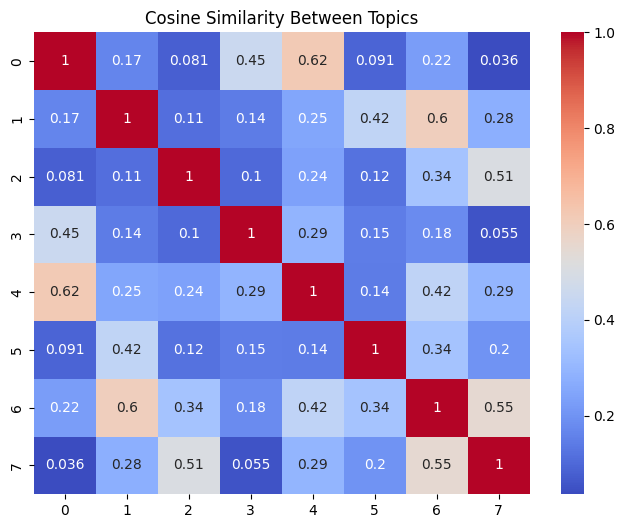

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


# Compute topic similarity matrix
topic_matrix = np.array(lda_model.get_topics())
similarity_matrix = cosine_similarity(topic_matrix)

# Adjust topic numbering to start from 0 and limit to topics 0-7
num_topics_to_display = 8
similarity_matrix = similarity_matrix[:num_topics_to_display, :num_topics_to_display]

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(similarity_matrix, annot=True, cmap="coolwarm", xticklabels=range(0, num_topics_to_display), yticklabels=range(0, num_topics_to_display))
plt.title("Cosine Similarity Between Topics")
plt.show()

In [ ]:
# Single Topic Approach
def get_dominant_topic(lda_model, bow):
    topic_probs = lda_model.get_document_topics(bow)
    if not topic_probs:
        return None
    return max(topic_probs, key=lambda x: x[1])[0]

topic_assign = [get_dominant_topic(lda_model, doc_bow) for doc_bow in corpus]
df_posts['lda_topic'] = topic_assign

df_posts['lda_topic'] = df_posts['lda_topic'].apply(lambda x: -1 if x is None else x)
df_posts['lda_topic'] = df_posts['lda_topic'].astype(int)

In [ ]:
df_posts

,id,title,selftext,had_removed_placeholder,combined_text,detected_lang,cleaned_text,text_length,lda_topic
1,16wneyf,Houthi Music Video Threatening Israel: The Zio...,Aired earlier this month on the Houthis' offic...,False,Houthi Music Video Threatening Israel: The Zio...,en,houthi music video threaten israel zionism dis...,23,0
2,16wpf89,A peace deal between the Saudis and Israelis c...,NaN,False,A peace deal between the Saudis and Israelis c...,en,peace deal saudi israeli could change everythi...,9,0
3,16wqaq6,is it true the 40% of israelis think of immigr...,Is it true ?! If so why ?!,False,is it true the 40% of israelis think of immigr...,en,true israeli think immigration israel true,6,4
4,16wqqcd,Queer in Jerusalem,I am out and proud Queer man (very straight pa...,False,Queer in Jerusalem I am out and proud Queer ma...,en,queer jerusalem proud queer man straight pas t...,36,1
7,16wred6,"Is there still racism between askenzai, sephar...",NaN,True,"Is there still racism between askenzai, sephar...",en,still racism askenzai sephardic mizardi ethiop...,7,7
...,...,...,...,...,...,...,...,...,...
72229,1gy0m2o,Thank You,I wanted to thank you guys for the advice you'...,False,Thank You I wanted to thank you guys for the a...,en,thank want thank guy advice youve give story y...,33,6
72230,1gy9slo,Looking for Book Recommendations on Reformed J...,Hi everyone!\n\nI’m planning to convert to Ref...,False,Looking for Book Recommendations on Reformed J...,en,look book recommendation reform jewish everyon...,52,7
72231,1gzg1nt,"Hello, is it possible to be jewish and hindu a...",I am currently converting to reform judaism an...,False,"Hello, is it possible to be jewish and hindu a...",en,hello possible jewish hindu time currently con...,62,7
72232,1h1osgd,Infinite Light,"Hi, all, I grew up orthodox, then spent many y...",False,"Infinite Light Hi, all, I grew up orthodox, th...",en,infinite light grow orthodox spend many year l...,73,7


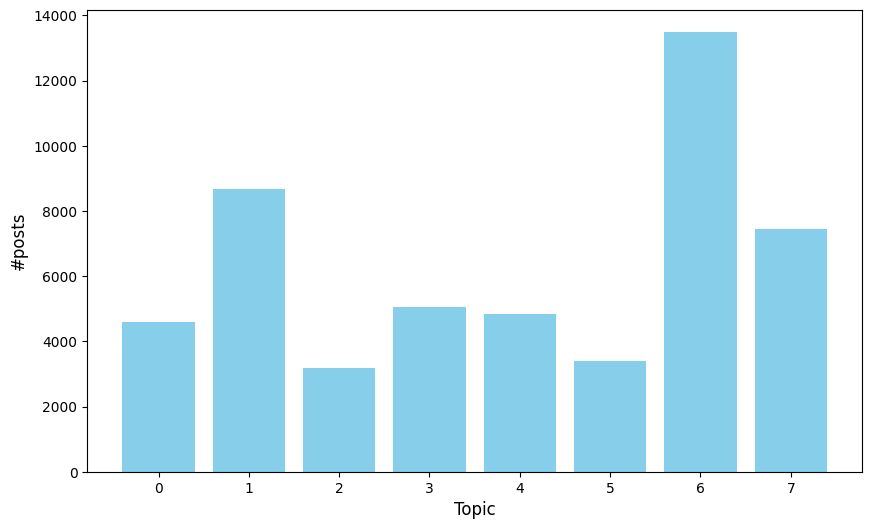

In [ ]:
import matplotlib.pyplot as plt

topic_counts = df_posts['lda_topic'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(topic_counts.index, topic_counts.values, color='skyblue')

plt.xlabel("Topic", fontsize=12)
plt.ylabel("#posts", fontsize=12)

plt.xticks(topic_counts.index)

plt.show()

In [ ]:
def show_lda_examples(df, topic_id, n=5):
    subset = df[df['lda_topic'] == topic_id].copy()
    # Sort by something relevant (like ID or 'score' if you had it)
    subset.sort_values('id', ascending=True, inplace=True)
    examples = subset.head(n)
    print(f"\n=== Top {n} docs for LDA Topic #{topic_id} ===")
    for i, row in examples.iterrows():
        print("---------------------------")
        print("Doc ID:", row['id'])
        print("Original Text:", row['combined_text'][:2000])
        print("---------------------------\n")

num_topics_lda = best_k
for t_id in range(num_topics_lda):
    show_lda_examples(df_posts, t_id, n=5)


=== Top 5 docs for LDA Topic #0 ===
---------------------------
Doc ID: 16wneyf
Original Text: Houthi Music Video Threatening Israel: The Zionists Will Be Disgraced, Jerusalem Will Be Cleansed Of The Filth Of The Jews Aired earlier this month on the Houthis' official television channel. Any other Yemenite Jew here finds the composition familiar?
---------------------------

---------------------------
Doc ID: 16wpf89
Original Text: A peace deal between the Saudis and Israelis could change everything: Fareed Zakaria 
---------------------------

---------------------------
Doc ID: 16wx2rx
Original Text: The Chief of Staff of the Minister of National Security (Ben Gvir's 2nd) operated a stand for the sale of the four species in Jerusalem. Sold products without receipts if the customers didn't ask and during the sale handed his personal gun over to a customer to play with 
---------------------------

---------------------------
Doc ID: 16wx3ez
Original Text: The Chief of Staff of the Mi

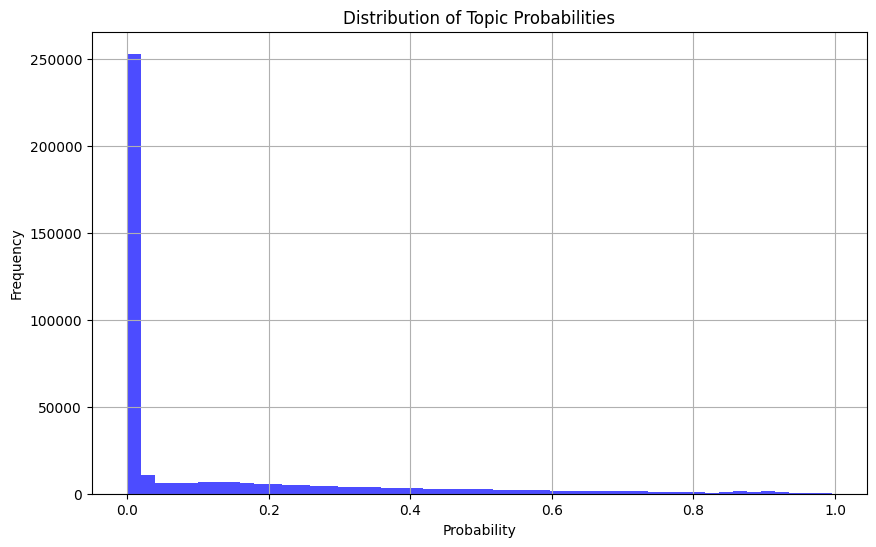

In [ ]:
# Multiple Topics Approach (Topic Distribution)
# Get the full distribution for each document
topic_distributions = [lda_model.get_document_topics(bow, minimum_probability=0) for bow in corpus]

# Flatten the list to get all probability values
probabilities = [prob for sublist in topic_distributions for _, prob in sublist]

# Plotting the distribution of probabilities
plt.figure(figsize=(10, 6))
plt.hist(probabilities, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Topic Probabilities')
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Saving the figure to a file
plt.savefig("/dt/yisroel/Users/luzone/BIG_DATA/IMAGES/LDA/topic_probabilities_distribution.png", dpi=300, bbox_inches='tight')
plt.close()

In [ ]:
def print_document_topics(lda_model, corpus, document_index, num_words=10):
    # Get the topic distribution for the specific document
    document_topics = lda_model.get_document_topics(corpus[document_index], minimum_probability=0.0)

    print(f"Document index: {document_index}")
    print("Topic distribution:")
    for topic_id, prob in document_topics:
        # Get the top words for this topic
        words = lda_model.show_topic(topic_id, topn=num_words)
        words = ', '.join([word for word, _ in words])
        print(f"Topic {topic_id} ({prob:.4f}): {words}")

# Example usage
document_index = 1
print_document_topics(lda_model, corpus, document_index)

# Print the text of the document
print("\nSample Document Text:")
print(docs[document_index])

Document index: 1
Topic distribution:
Topic 0 (0.4391): israel, war, iran, israeli, gaza, say, hamas, hezbollah, army, idf
Topic 1 (0.0140): get, know, would, want, like, work, look, make, go, anyone
Topic 2 (0.0140): jewish, antisemitism, student, antisemitic, university, post, protest, campus, zionism, holocaust
Topic 3 (0.0140): hamas, gaza, kill, israeli, hostage, october, attack, israel, terrorist, palestinian
Topic 4 (0.0140): israel, jewish, state, palestinian, country, israeli, arab, land, people, world
Topic 5 (0.0140): torah, one, book, song, day, say, god, music, read, prayer
Topic 6 (0.4770): jewish, people, like, feel, say, think, know, get, see, make
Topic 7 (0.0140): jewish, convert, reform, would, community, family, know, rabbi, like, question

Sample Document Text:
['peace', 'deal', 'saudi', 'israeli', 'could', 'change', 'everything', 'fare', 'zakaria']


In [ ]:
def get_topic_distribution(lda_model, bow, threshold=0.1):
    """
    Return list of (topic_id, prob) if prob >= threshold.
    """
    topic_probs = lda_model.get_document_topics(bow, minimum_probability=0)
    # filter by threshold
    multi = [(t_id, float(prob)) for (t_id, prob) in topic_probs if prob >= threshold]
    return multi

df_posts['lda_topics_multi'] = [get_topic_distribution(lda_model, b, threshold=0.10) for b in corpus]

In [ ]:
df_posts

,id,title,selftext,had_removed_placeholder,combined_text,detected_lang,cleaned_text,text_length,lda_topic,lda_topics_multi
1,16wneyf,Houthi Music Video Threatening Israel: The Zio...,Aired earlier this month on the Houthis' offic...,False,Houthi Music Video Threatening Israel: The Zio...,en,houthi music video threaten israel zionism dis...,23,0,"[(0, 0.28625279664993286), (3, 0.2087232470512..."
2,16wpf89,A peace deal between the Saudis and Israelis c...,NaN,False,A peace deal between the Saudis and Israelis c...,en,peace deal saudi israeli could change everythi...,9,0,"[(0, 0.4391004741191864), (6, 0.47700086236000..."
3,16wqaq6,is it true the 40% of israelis think of immigr...,Is it true ?! If so why ?!,False,is it true the 40% of israelis think of immigr...,en,true israeli think immigration israel true,6,4,"[(4, 0.874867856502533)]"
4,16wqqcd,Queer in Jerusalem,I am out and proud Queer man (very straight pa...,False,Queer in Jerusalem I am out and proud Queer ma...,en,queer jerusalem proud queer man straight pas t...,36,1,"[(1, 0.5456295013427734), (6, 0.35790771245956..."
7,16wred6,"Is there still racism between askenzai, sephar...",NaN,True,"Is there still racism between askenzai, sephar...",en,still racism askenzai sephardic mizardi ethiop...,7,7,"[(2, 0.1990147978067398), (7, 0.67584353685379..."
...,...,...,...,...,...,...,...,...,...,...
72229,1gy0m2o,Thank You,I wanted to thank you guys for the advice you'...,False,Thank You I wanted to thank you guys for the a...,en,thank want thank guy advice youve give story y...,33,6,"[(1, 0.1650102138519287), (6, 0.71212106943130..."
72230,1gy9slo,Looking for Book Recommendations on Reformed J...,Hi everyone!\n\nI’m planning to convert to Ref...,False,Looking for Book Recommendations on Reformed J...,en,look book recommendation reform jewish everyon...,52,7,"[(1, 0.25198832154273987), (7, 0.6305670738220..."
72231,1gzg1nt,"Hello, is it possible to be jewish and hindu a...",I am currently converting to reform judaism an...,False,"Hello, is it possible to be jewish and hindu a...",en,hello possible jewish hindu time currently con...,62,7,"[(1, 0.21443749964237213), (5, 0.1232701167464..."
72232,1h1osgd,Infinite Light,"Hi, all, I grew up orthodox, then spent many y...",False,"Infinite Light Hi, all, I grew up orthodox, th...",en,infinite light grow orthodox spend many year l...,73,7,"[(6, 0.14587613940238953), (7, 0.8439725041389..."


In [ ]:
missing_lda_topic = df_posts['lda_topic'].isnull().sum()
missing_lda_topics_multi = df_posts['lda_topics_multi'].isnull().sum()

print(f"Number of missing values in 'lda_topic': {missing_lda_topic}")
print(f"Number of missing values in 'lda_topics_multi': {missing_lda_topics_multi}")

Number of missing values in 'lda_topic': 0
Number of missing values in 'lda_topics_multi': 0


In [ ]:
df_posts.to_csv("/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/posts_with_lda_topics.csv", index=False)

## Build LDA on Comments

In [ ]:
# Create BoW representations for comments using the same dictionary
comment_corpus = [dictionary.doc2bow(t) for t in comment_tokens]

In [ ]:
# Function to determine the dominant topic for each comment
def get_dominant_topic(lda_model, bow):
    topic_probs = lda_model.get_document_topics(bow)
    if not topic_probs:
        return None
    return max(topic_probs, key=lambda x: x[1])[0]

df_comments['lda_topic'] = [get_dominant_topic(lda_model, doc_bow) for doc_bow in comment_corpus]
df_comments['lda_topic'] = df_comments['lda_topic'].apply(lambda x: -1 if x is None else x)
df_comments['lda_topic'] = df_comments['lda_topic'].astype(int)

# Display the unique topics identified in comments
print("Unique LDA Topics in Comments:")
print(df_comments['lda_topic'].unique())

Unique LDA Topics in Comments:
[6 5 1 7 4 3 2 0]


In [ ]:
def get_topic_distribution(lda_model, bow, threshold=0.1):
    topic_probs = lda_model.get_document_topics(bow, minimum_probability=0)
    multi = [(t_id, float(prob)) for (t_id, prob) in topic_probs if prob >= threshold]
    return multi

df_comments['lda_topics_multi'] = [get_topic_distribution(lda_model, doc_bow, threshold=0.10) for doc_bow in comment_corpus]

In [ ]:
missing_lda_topic = df_comments['lda_topic'].isnull().sum()
missing_lda_topics_multi = df_comments['lda_topics_multi'].isnull().sum()

print(f"Number of missing values in 'lda_topic': {missing_lda_topic}")
print(f"Number of missing values in 'lda_topics_multi': {missing_lda_topics_multi}")

Number of missing values in 'lda_topic': 0
Number of missing values in 'lda_topics_multi': 0


In [ ]:
df_comments

,id,body,detected_lang,cleaned_text,lda_topic,lda_topics_multi
2,k2xn704,"Probably a terrible suggestion, but some over ...",en,probably terrible suggestion enthusiastic morm...,6,"[(1, 0.23002295196056366), (6, 0.4719747900962..."
3,k2xngji,"There was a great big moose, who liked to drin...",en,great big moose like drink lot juice,5,"[(5, 0.4607444703578949), (6, 0.432133287191391)]"
4,k2xns1o,I know they live in Israel and serve. Never he...,en,know live israel serve never hear anyone probl...,6,"[(4, 0.39361414313316345), (6, 0.5486109852790..."
5,k2xofq0,If OPs mother doesn't know Hebrew (like I imag...,en,ops mother doesnt know hebrew like imagine tou...,1,"[(1, 0.3533746898174286), (5, 0.11918429285287..."
6,k2xosu4,The yiddish speaking ppl in israel also know h...,en,yiddish speak ppl israel also know hebrew lang...,7,"[(6, 0.32970789074897766), (7, 0.5951330661773..."
...,...,...,...,...,...,...
1380097,lzqukc3,"My sibling in Moshe, what drugs have you been ...",en,sibling moshe drug take ask two rabbi response...,7,"[(5, 0.2684715986251831), (6, 0.32490223646163..."
1380098,lzrakvb,"""steal our stuff"" is quite mean if you meant t...",en,steal stuff quite mean mean equate convert,6,"[(4, 0.2709263563156128), (6, 0.40471482276916..."
1380100,lzrjaje,You are not for us. Sorry. I don't mean that i...,en,sorry dont mean cruel way nope,6,"[(1, 0.20525410771369934), (6, 0.6872076988220..."
1380102,lzrk0cc,The services I attend at my Reform synagogue a...,en,service attend reform synagogue discus praise ...,7,"[(6, 0.19095341861248016), (7, 0.6704261302947..."


In [ ]:
df_comments.to_csv("/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/comments_with_topics.csv", index=False)

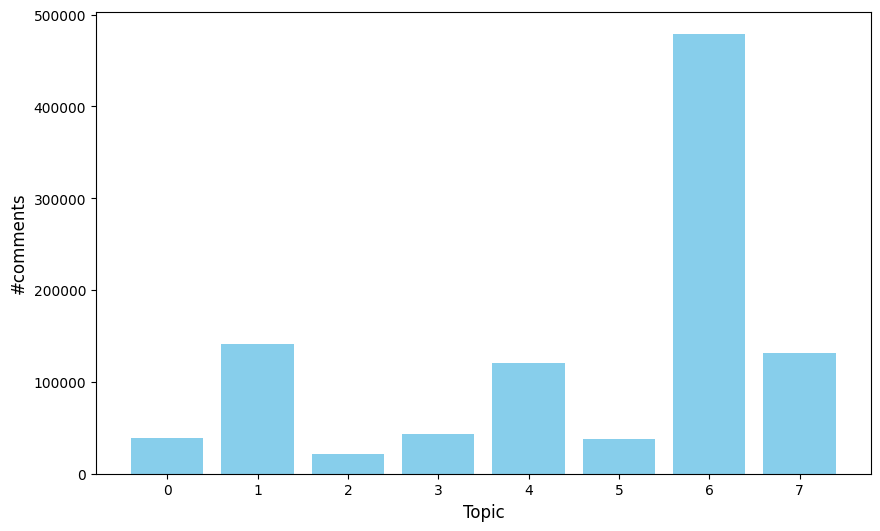

In [ ]:
topic_counts = df_comments['lda_topic'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(topic_counts.index, topic_counts.values, color='skyblue')

plt.xlabel("Topic", fontsize=12)
plt.ylabel("#comments", fontsize=12)

plt.xticks(topic_counts.index)

plt.show()

## Visualization of topics

In [ ]:
all_posts = pd.read_csv("/dt/yisroel/Users/luzone/BIG_DATA/all_subreddits_submissions.csv")
all_comments = pd.read_csv("/dt/yisroel/Users/luzone/BIG_DATA/all_subreddits_comments.csv")

posts_topics = pd.read_csv("/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/posts_with_lda_topics.csv")
comments_topics = pd.read_csv("/dt/yisroel/Users/luzone/BIG_DATA/models/LDA/comments_with_topics.csv")

/tmp/ipykernel_2635969/4136312757.py:1: DtypeWarning:

Columns (36) have mixed types. Specify dtype option on import or set low_memory=False.

/tmp/ipykernel_2635969/4136312757.py:2: DtypeWarning:

Columns (4,30) have mixed types. Specify dtype option on import or set low_memory=False.

/tmp/ipykernel_2635969/4136312757.py:5: DtypeWarning:

Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
comments_topics['lda_topic'] = pd.to_numeric(
    comments_topics['lda_topic'],
    errors='coerce'
).fillna(-1).astype(int)

comments_topics = comments_topics[comments_topics['lda_topic'] != -1]

In [ ]:
# Merging posts tables
merged_posts = posts_topics.merge(
    all_posts,
    on='id',
    how='inner'
)

# Merging comments tables
merged_comments = comments_topics.merge(
    all_comments,
    on='id',
    how='inner'
)

In [ ]:
merged_posts.columns

Index(['id', 'title_x', 'selftext_x', 'had_removed_placeholder',
       'combined_text', 'detected_lang', 'cleaned_text', 'text_length',
       'lda_topic', 'lda_topics_multi', 'author', 'author_fullname',
       'created_utc_raw', 'created_utc', 'edited', 'score', 'ups', 'downs',
       'gilded', 'gildings', 'total_awards_received', 'author_flair_text',
       'user_flair_text', 'author_premium', 'author_is_blocked',
       'distinguished', 'locked', 'stickied', 'archived', 'retrieved_on',
       'subreddit_id', 'subreddit', 'subreddit_subscribers', 'title_y',
       'selftext_y', 'num_comments', 'upvote_ratio', 'link_flair_text', 'url',
       'domain', 'over_18', 'is_self', 'is_video', 'spoiler', 'num_crossposts',
       'poll_data', 'month'],
      dtype='object')

In [ ]:
merged_comments.columns

Index(['id', 'body_x', 'detected_lang', 'cleaned_text', 'lda_topic',
       'lda_topics_multi', 'author', 'author_fullname', 'created_utc_raw',
       'created_utc', 'edited', 'score', 'ups', 'downs', 'gilded', 'gildings',
       'total_awards_received', 'author_flair_text', 'user_flair_text',
       'author_premium', 'author_is_blocked', 'distinguished', 'locked',
       'stickied', 'archived', 'retrieved_on', 'body_y', 'parent_id',
       'link_id', 'is_submitter', 'controversiality', 'subreddit',
       'comment_type', 'score_hidden', 'collapsed', 'collapsed_reason',
       'submission_id', 'month'],
      dtype='object')

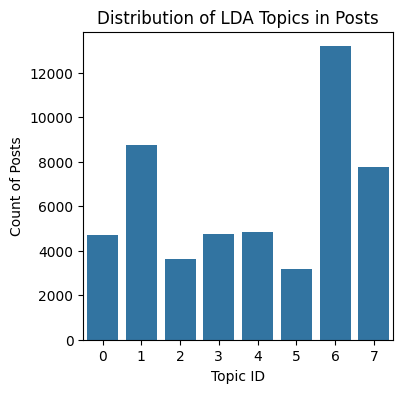

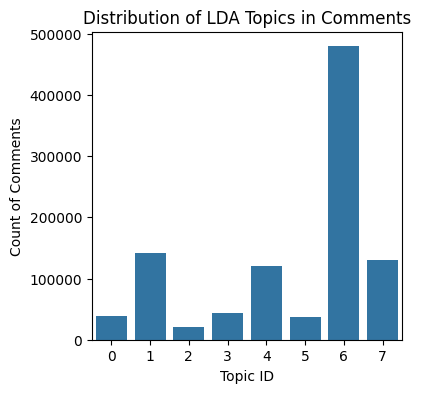

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

topic_counts_posts = merged_posts['lda_topic'].value_counts().sort_index()

plt.figure(figsize=(4,4))
sns.barplot(x=topic_counts_posts.index, y=topic_counts_posts.values)
plt.title("Distribution of LDA Topics in Posts")
plt.xlabel("Topic ID")
plt.ylabel("Count of Posts")
plt.show()


topic_counts_comments = merged_comments['lda_topic'].value_counts().sort_index()

plt.figure(figsize=(4,4))
sns.barplot(x=topic_counts_comments.index, y=topic_counts_comments.values)
plt.title("Distribution of LDA Topics in Comments")
plt.xlabel("Topic ID")
plt.ylabel("Count of Comments")
plt.show()

In [ ]:
# Define figure size for heatmaps
FIGURE_SIZE = (6, 3)


# Processing for Posts
# Count the number of posts per subreddit and LDA topic
post_topic_sub = merged_posts.groupby(['subreddit', 'lda_topic'])['id'].count().reset_index()
post_topic_sub.columns = ['subreddit', 'lda_topic', 'count_posts']

# Pivot the data to create a heatmap-friendly format
pivot_posts = post_topic_sub.pivot(index='subreddit', columns='lda_topic', values='count_posts').fillna(0)


# Processing for Comments
# Count the number of comments per subreddit and LDA topic
comment_topic_sub = merged_comments.groupby(['subreddit', 'lda_topic'])['id'].count().reset_index()
comment_topic_sub.columns = ['subreddit', 'lda_topic', 'count_comments']

# Pivot the data to create a heatmap-friendly format
pivot_comments = comment_topic_sub.pivot(index='subreddit', columns='lda_topic', values='count_comments').fillna(0)


# Display Pivot Tables One Below the Other
print("Post Distribution Table:")
print(pivot_posts)
print("\nComment Distribution Table:")
print(pivot_comments)

Post Distribution Table:
lda_topic      0     1     2     3     4     5     6     7
subreddit                                                 
Israel      4045  3125  1545  3764  3479   604  5539   706
Jewish       427  2329  1283   607   740   902  4639  2193
Judaism      208  3167   774   372   624  1625  2939  4650
ReformJews     7   118     5     4     9    34    56   189

Comment Distribution Table:
lda_topic       0      1     2      3      4      5       6      7
subreddit                                                         
Israel      32262  44393  8265  33513  78282   8139  219661  17894
Jewish       4299  40927  8965   6679  24075   9318  157584  40439
Judaism      1950  54527  3812   3533  17640  20105  100235  70565
ReformJews     16   1068    46     42    175    216    1675   2054


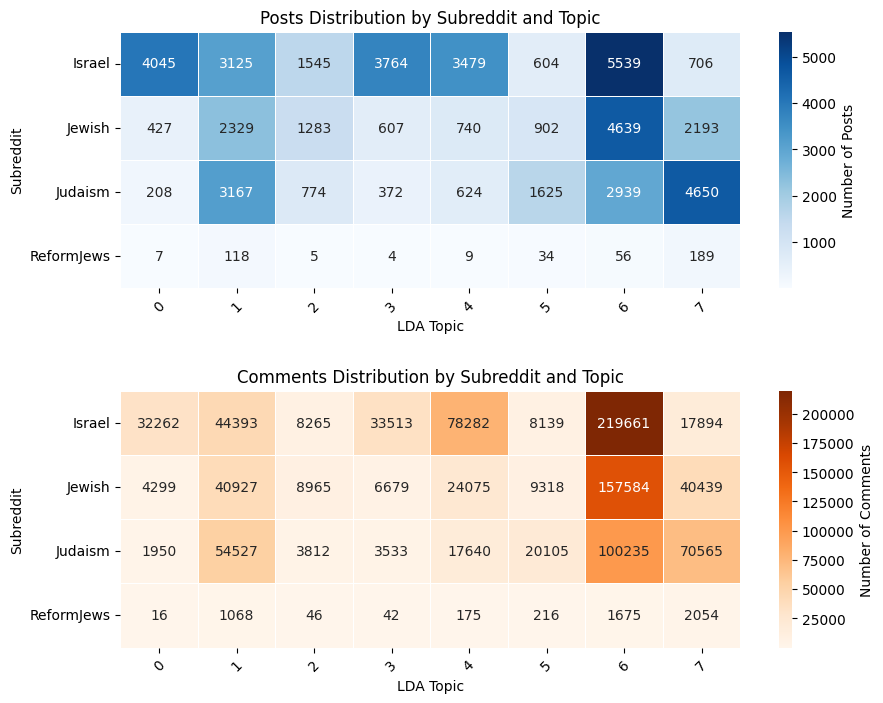

In [ ]:
# Create Heatmaps
fig, axes = plt.subplots(nrows=2, figsize=(10, 8))  # Two plots, one below the other

# Heatmap for posts (Blue)
sns.heatmap(pivot_posts, cmap='Blues', annot=True, fmt=".0f", linewidths=0.5,
            cbar_kws={'label': 'Number of Posts'}, ax=axes[0])
axes[0].set_title("Posts Distribution by Subreddit and Topic")
axes[0].set_xlabel("LDA Topic")
axes[0].set_ylabel("Subreddit")
axes[0].tick_params(axis='x', rotation=45)
axes[0].tick_params(axis='y', rotation=0)

# Heatmap for comments (Orange)
sns.heatmap(pivot_comments, cmap='Oranges', annot=True, fmt=".0f", linewidths=0.5,
            cbar_kws={'label': 'Number of Comments'}, ax=axes[1])
axes[1].set_title("Comments Distribution by Subreddit and Topic")
axes[1].set_xlabel("LDA Topic")
axes[1].set_ylabel("Subreddit")
axes[1].tick_params(axis='x', rotation=45)
axes[1].tick_params(axis='y', rotation=0)

plt.subplots_adjust(hspace=0.4)
plt.show()

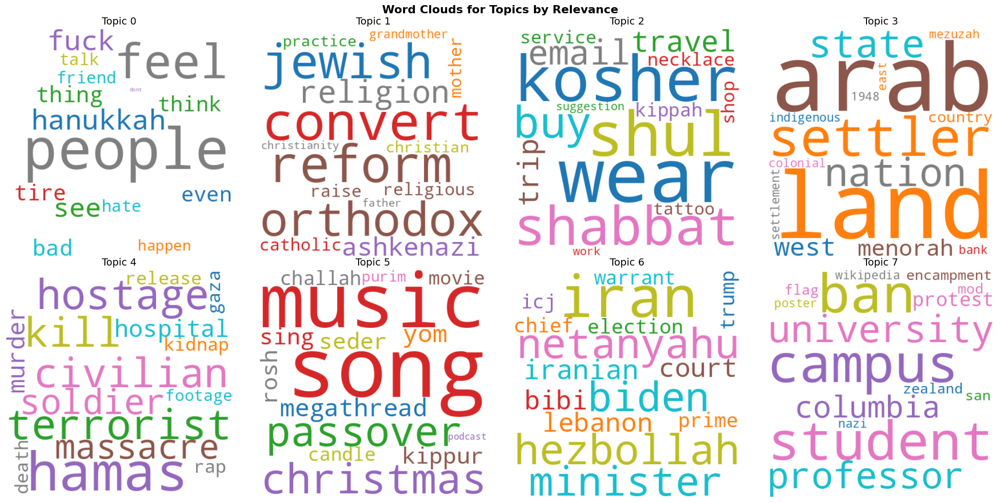

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordclouds_from_relevance(df_relevance, num_topics=8, words_per_topic=15, title="Word Clouds for Topics by Relevance"):
    """
    Generate word clouds for each topic based on the most relevant words.

    :param df_relevance: DataFrame containing relevance scores for each topic.
    :param num_topics: Total number of topics.
    :param words_per_topic: Number of top relevant words to include in the word cloud.
    :param title: Title for the overall figure.
    """
    # Create subplots: 4 topics per row, so 2 rows for 8 topics
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
    axes = axes.flatten()

    for t_id in range(num_topics):
        # Extract top words for the topic based on relevance
        words = df_relevance[f"Topic {t_id}"][:words_per_topic]
        relevance_scores = df_relevance[f"Relevance {t_id}"][:words_per_topic]

        # Create frequency dictionary for WordCloud (word -> relevance score)
        word_freq = {word: relevance for word, relevance in zip(words, relevance_scores)}

        # Generate Word Cloud
        wordcloud = WordCloud(width=400, height=400, background_color="white", colormap="tab10").generate_from_frequencies(word_freq)

        # Plot
        axes[t_id].imshow(wordcloud, interpolation="bilinear")
        axes[t_id].set_title(f"Topic {t_id}", fontsize=14)
        axes[t_id].axis("off")

    plt.suptitle(title, fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()


generate_wordclouds_from_relevance(df_topic_relevance, num_topics=8, words_per_topic=50)


## Topic Distribution Across Subreddits Over Time

In [ ]:
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import plotly.io as pio
pio.renderers.default = "notebook_connected"

In [ ]:
# Ensure date format is correct
merged_posts['month'] = pd.to_datetime(merged_posts['month'])
merged_comments['month'] = pd.to_datetime(merged_comments['month'])

# Combine posts + comments
merged = pd.concat([
    merged_posts[['subreddit', 'month', 'lda_topic']],
    merged_comments[['subreddit', 'month', 'lda_topic']]
])


merged['lda_topic_label'] = merged['lda_topic'].map(topic_labels)

# Filter for main subreddits
selected_subreddits = ['Israel', 'Jewish', 'Judaism', 'Palestine']
merged = merged[merged['subreddit'].isin(selected_subreddits)]

# Group by subreddit, month, topic
topic_trend = merged.groupby(['subreddit', 'month', 'lda_topic_label']).size().reset_index(name='count')
topic_trend = topic_trend.sort_values('month')


# Line Plot to show topic evolution per subreddit
fig_line = px.line(
    topic_trend,
    x='month',
    y='count',
    color='lda_topic_label',
    facet_row='subreddit',
    title="Topic Evolution Over Time - Line Plot",
    labels={'lda_topic_label': 'LDA Topic'},
    color_discrete_map=custom_colors,
    height=1000,
    width=1000
)
fig_line.update_layout(
    legend_title_text="Topic",
    xaxis_title="Month",
    yaxis_title="Number of Posts/Comments",
    template="plotly_white"
)
fig_line.update_xaxes(tickangle=45)

# Show Line Plot
fig_line.show()

/home/luzone/.conda/envs/edenenv/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:2596: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/home/luzone/.conda/envs/edenenv/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:2596: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



## **BERTopic**

In [ ]:
stop_words = set(stopwords.words('english'))

def minimal_bert_clean(text):
    """
    1. Lowercase
    2. Remove placeholders [removed]/[deleted]
    3. Remove URLs
    4. (Optionally) remove punctuation
    5. Tokenize, remove short tokens if needed
    6. Rejoin
    """
    if not isinstance(text, str):
        return ""

    text = text.lower()
    # remove placeholders
    text = re.sub(r'removedremoved|deleteddeleted', '', text)

    # remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)

    # optional: remove punctuation
    # if you want to keep punctuation for context, comment this out
    text = text.translate(str.maketrans('', '', string.punctuation))

    # tokenize
    tokens = word_tokenize(text)

    # optional: remove stopwords or short tokens
    # BERT can handle them, but some folks remove them to reduce noise
    cleaned = []
    for t in tokens:
        if t in stop_words:
            continue
        # remove tokens <3 chars if you want
        if len(t)<3:
            continue
        cleaned.append(t)

    return " ".join(cleaned)

In [ ]:
df_posts['cleaned_text_bert'] = df_posts['combined_text'].fillna('').apply(minimal_bert_clean)
all_docs = df_posts['cleaned_text_bert'].tolist()

In [ ]:
model_st = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = model_st.encode(all_docs, show_progress_bar=True)

Batches: 100%|██████████| 2129/2129 [00:14<00:00, 148.25it/s]


In [ ]:
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
topics, probs = topic_model.fit_transform(all_docs, embeddings)

2025-02-05 11:33:24,098 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-02-05 11:33:59,860 - BERTopic - Dimensionality - Completed ✓
2025-02-05 11:33:59,874 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

In [ ]:
# Save the model
import pickle
model_path = "/dt/yisroel/Users/luzone/BIG_DATA/BerTopic_model.pkl"
with open(model_path, "wb") as f:
    pickle.dump(topic_model, f)
print(f"BERTopic model saved to: {model_path}")

/home/luzone/.conda/envs/edenenv/lib/python3.11/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


BERTopic model saved to: /dt/yisroel/Users/luzone/BIG_DATA/BerTopic_model.pkl


In [ ]:
import matplotlib.pyplot as plt

def visualize_topic_distribution(model, docs, embeddings, num_topics=12):
    # Ensure embeddings are passed or correctly handled inside the model
    topics, probs = model.transform(docs, embeddings)

    # Flatten the list of probabilities for the first 12 topics
    all_probs = [prob[:num_topics] for prob in probs]
    all_probs = [item for sublist in all_probs for item in sublist]  # Flatten the list

    # Plotting the distribution of probabilities
    plt.figure(figsize=(10, 5))
    plt.hist(all_probs, bins=100, alpha=0.75, color='blue')
    plt.title('Distribution of Topic Probabilities for the First 12 Topics')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# Assuming embeddings have been precomputed
visualize_topic_distribution(topic_model, all_docs, embeddings)


In [ ]:
topic_model.get_topic_info(0)

,Topic,Count,Name,Representation,Representative_Docs
0,0,948,0_music_song_songs_playlist,"[music, song, songs, playlist, artists, spotif...","[know song, song, jewish music]"


In [ ]:
def print_document_topics_and_text(model, doc, threshold=0.10, max_topics=12):
    topics, probs = model.transform(doc)
    print(f"Document Text: {doc}")
    print("\nTopics and their probabilities:")
    for i, (topic, prob) in enumerate(zip(topics, probs)):
        if i >= max_topics:
            break  # Stop after the first 12 topics
        if prob >= threshold:
            words = model.get_topic(topic)
            if words is None:
                continue  # Handles -1 or similar for outliers/noise
            words = ', '.join([word for word, _ in words])
            print(f"Topic {topic}: {prob:.4f}, Words: {words}")


document_index = 0
print_document_topics_and_text(bertopic_model, docs[document_index])

In [ ]:
def single_topic_first12(prob_row, threshold=0.10, max_topic=12):
    """
    Return the single best topic from [0..11] if prob >= threshold,
    otherwise None.
    """
    # slice first 12
    restricted = prob_row[:max_topic]
    best_t = np.argmax(restricted)
    best_p = restricted[best_t]
    if best_p < threshold:
        return None
    return best_t

df_posts['bertopic_single'] = [
    single_topic_first12(probs[i], threshold=0.10, max_topic=12)
    for i in range(len(df_posts))
]

,Topic,Count,Name,Representation,Representative_Docs
0,-1,31748,-1_people_jews_jewish_israel,"[people, jews, jewish, israel, like, feel, eve...",[patrilineal jews feel left rise antisemitism ...
1,0,1118,0_music_song_songs_playlist,"[music, song, songs, playlist, lyrics, artists...",[best israeli music hey guys amazing playlist ...
2,1,766,1_iran_iranian_nuclear_iranians,"[iran, iranian, nuclear, iranians, attack, mis...","[israel going iran, iran attack, attack israel..."
3,2,705,2_n12_benjamin_710_yisrayil,"[n12, benjamin, 710, yisrayil, nephesh, hitgas...",[chbli shaul שְׁאוֹל חֶבְלֵי mean exactly hell...
4,3,651,3_antisemitism_antisemitic_reddit_rise,"[antisemitism, antisemitic, reddit, rise, adl,...","[antisemitism, antisemitism, antisemitism]"
...,...,...,...,...,...
692,691,10,691_shelter_givatiim_cats_mamad,"[shelter, givatiim, cats, mamad, bnb, generato...",[anticipating war hezbollah prepare something ...
693,692,10,692_heights_golan_syria_occupied,"[heights, golan, syria, occupied, minefields, ...","[work computer decided live golan heights, int..."
694,693,10,693_masechta_interview_shivah_chol,"[masechta, interview, shivah, chol, hamoed, mo...",[perspective jewish intelligence hey everyone ...
695,694,10,694_sad_unfortunate_truth_absurd,"[sad, unfortunate, truth, absurd, true, sounds...","[sad true, sad, sad true]"


In [ ]:
def multi_topics_first12(prob_row, threshold=0.10, max_topic=12):
    """
    Return list of (topic_id, prob) for topics in [0..11]
    that have probability >= threshold.
    """
    restricted = prob_row[:max_topic]
    pairs = []
    for t_id, p in enumerate(restricted):
        if p >= threshold:
            pairs.append((t_id, p))
    return pairs

df_posts['bertopic_multi'] = [
    multi_topics_first12(probs[i], threshold=0.10, max_topic=12)
    for i in range(len(df_posts))
]

In [ ]:
topic_model.get_topic_info(0)

,Topic,Count,Name,Representation,Representative_Docs
0,0,1118,0_music_song_songs_playlist,"[music, song, songs, playlist, lyrics, artists...",[best israeli music hey guys amazing playlist ...


In [ ]:
ef show_examples_for_topic(df, topic_id, single_topic_col='bertopic_single'):
    """
    Print 5 example posts whose single-topic column == topic_id.
    """
    subset = df[df[single_topic_col] == topic_id]
    print(f"\n=== Topic {topic_id} - total docs: {len(subset)} ===")
    examples = subset.head(5)
    for i, row in examples.iterrows():
        print("--------------------------------")
        print("Post ID:", row.get('id', 'N/A'))
        print("Title:", row.get('title','N/A')[:80])
        print("Cleaned Text:", row['cleaned_text_bert'][:500])
        print("--------------------------------")

for t_id in range(12):
    show_examples_for_topic(df_posts, t_id, single_topic_col='bertopic_single')

In [ ]:
df_posts.to_csv("/path/to/posts_with_bertopic.csv", index=False)
print("Saved posts_with_bertopic.csv with new columns:\n 'bertopic_single', 'bertopic_multi'")

In [ ]:
! pip install --upgrade nbformat

/home/luzone/.conda/envs/edenenv/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:2596: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



AttributeError: 'NoneType' object has no attribute '__version__'

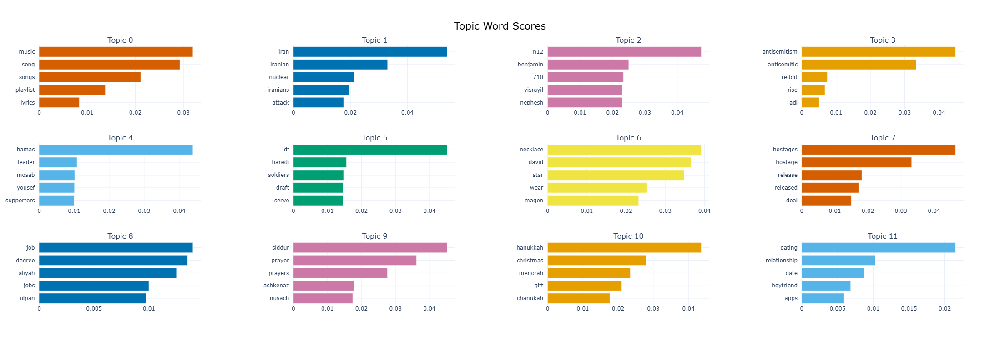

In [ ]:
topic_model.visualize_barchart(top_n_topics=12)

In [2]:
import pandas as pd

# יצירת מילון עם דוגמאות נבחרות לכל נושא
example_posts = {
    "Topic 0": "Houthi Music Video Threatening Israel: The Zionists Will Be Disgraced, Jerusalem Will Be Cleansed Of The Filth Of The Jews. Any other Yemenite Jew here finds the composition familiar?",
    "Topic 1": "Coming to terms with my meaningless tattoos — I grew up a reform Jew, but I’m just now starting to really delve into my faith. I have two fairly big tattoos that I got rather impulsively a few years ago.",
    "Topic 2": "My brother is a white supremacist Jew who has renounced Judaism (CW: severe antisemitism)",
    "Topic 3": "Israeli soldier aims gun at child's head #evilIsraelapartheid #fascistracistscolonizers (this is making fun of propaganda where they edit the video)",
    "Topic 4": "is it true that 40% of Israelis think of immigration from Israel? If so why?",
    "Topic 5": "Sharing my Gluten Free Kugel recipe — 2 boxes of Gluten Free uncooked barilla rotini or penne, 8 eggs, 2 cups sour cream, and more.",
    "Topic 6": "We bombed Syria 5 times? My buddy out of nowhere msgs me with barely any context saying 'I didn’t know you guys bombed Syria 5 times'.",
    "Topic 7": "Talking to my rabbi — I am in the process of converting. I need to disclose some heavy trauma, but I don’t want to trauma dump on him."
}

# המרת המילון לדאטהפריים
df = pd.DataFrame(list(example_posts.items()), columns=["Topic", "Example Post"])

# הצגת הטבלה
df





,Topic,Example Post
0,Topic 0,Houthi Music Video Threatening Israel: The Zio...
1,Topic 1,Coming to terms with my meaningless tattoos — ...
2,Topic 2,My brother is a white supremacist Jew who has ...
3,Topic 3,Israeli soldier aims gun at child's head #evil...
4,Topic 4,is it true that 40% of Israelis think of immig...
5,Topic 5,Sharing my Gluten Free Kugel recipe — 2 boxes ...
6,Topic 6,We bombed Syria 5 times? My buddy out of nowhe...
7,Topic 7,Talking to my rabbi — I am in the process of c...
